<a href="https://colab.research.google.com/github/alanrolemberg/mvp/blob/main/DeepLearningMVP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

MVP - DeepLearning

Aluno: Alan Rolemberg Eliodorio

# Classificador de imagens multi-classe - Insetos Voadores

**Contexto:** Temos um conjunto de imagens que representam cinco categorias de insetos: Borboleta, Mosquito, Mosca, Abelha e Mariposa. O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem em alguma das categorias mencionadas acima.

**Estrutura:** O notebook está dividido assim:

1. Importação das bibliotecas
2. Acesso e tratamento dos dados que serão a entrada do modelo de deep learning
3. Configuração do modelo de deep learning usando uma rede neural convolucional (CNN) simples com Keras
4. Treinamento do modelo de deep learning
5. Execução do modelo de deep learning treinado em um subconjunto das imagens de teste
6. Avaliação do modelo de deep learning
7. Exportação do modelo de deep learning
8. Teste do modelo exportado

**Dataset:** O dataset FLYING INSECT IMAGE DATASET foi baixado do Kaggle, uma plataforma online voltada para cientistas de dados, entusiastas de aprendizado de máquina e profissionais afins. Para mais informações sobre o dataset, veja o link a seguir: [FLYING INSECT IMAGE DATASET](https://www.kaggle.com/datasets/ayeshaanamsiddiqui/flying-insect-image-dataset).

## 1. Importando as bibliotecas necessárias para executar o notebook

P.S. Para conseguir executar o notebook é necessário instalar bibliotecas como Tensorflow, keras, scikit-learn. Por exemplo:

`pip install tensorflow`

`pip install keras`

`pip install pandas`

`pip install scikit-learn`

In [ ]:
!pip install tensorflow
!pip install keras
!pip install pandas
!pip install scikit-learn

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt
#from google.colab import drive
#drive.mount('/content/drive')

!wget https://github.com/alanrolemberg/mvp/raw/main/FlyingInsectsDataset.zip
!wget https://github.com/alanrolemberg/mvp/raw/main/history_of_accuracy.sav
!wget https://github.com/alanrolemberg/mvp/raw/main/trained_model_FlyingInsects.model.zip



--2023-07-19 04:08:29--  https://github.com/alanrolemberg/mvp/raw/main/FlyingInsectsDataset.zip
Resolving github.com (github.com)... 192.30.255.113
Connecting to github.com (github.com)|192.30.255.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/alanrolemberg/mvp/main/FlyingInsectsDataset.zip [following]
--2023-07-19 04:08:29--  https://raw.githubusercontent.com/alanrolemberg/mvp/main/FlyingInsectsDataset.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33320742 (32M) [application/zip]
Saving to: ‘FlyingInsectsDataset.zip.1’

FlyingInsectsDatase 100%[===================>]  31.78M   173MB/s    in 0.2s    

2023-07-19 04:08:29 (173 MB/s) - ‘FlyingInsectsDataset.zip.1’ saved [33320742/333207

In [ ]:
!unzip FlyingInsectsDataset.zip
!unzip trained_model_FlyingInsects.model.zip

Archive:  FlyingInsectsDataset.zip
replace FlyingInsectsDataset/Mosquito.245.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: FlyingInsectsDataset/Mosquito.245.jpg  
  inflating: FlyingInsectsDataset/House_Fly.25.jpg  
  inflating: FlyingInsectsDataset/Butterfly.202.jpg  
  inflating: FlyingInsectsDataset/House_Fly.86.jpg  
  inflating: FlyingInsectsDataset/Mosquito.215.jpg  
  inflating: FlyingInsectsDataset/Honey_Bee.38.jpg  
  inflating: FlyingInsectsDataset/House_Fly.134.jpg  
  inflating: FlyingInsectsDataset/Locust.66.jpg  
  inflating: FlyingInsectsDataset/Honey_Bee.68.jpg  
  inflating: FlyingInsectsDataset/Locust.156.jpg  
  inflating: FlyingInsectsDataset/Mosquito.46.jpg  
  inflating: FlyingInsectsDataset/House_Fly.224.jpg  
  inflating: FlyingInsectsDataset/Butterfly.131.jpg  
  inflating: FlyingInsectsDataset/House_Fly.173.jpg  
  inflating: FlyingInsectsDataset/Mosquito.1.jpg  
  inflating: FlyingInsectsDataset/Locust.37.jpg  
  inflating: FlyingInsectsDataset/Lo

## 2. Acessando e tratando os dados que serão a entrada do modelo de deep learning

Acessando o drives das imagens e verificando suas 40 imagens aleatorias
Exemplos de algumas imagens extraídas


In [ ]:

import os
import random


#diretorio = '/content/drive/MyDrive/Colab Notebooks/BugsDataset'

diretorio = '/content/FlyingInsectsDataset'

# Obtém a lista de arquivos no diretório
arquivos = os.listdir(diretorio)

# Seleciona uma amostra aleatória de 10 elementos da lista de arquivos
amostra = random.sample(arquivos, k=10)
df_amostra = pd.DataFrame(amostra,columns=None)

# Exibe as primeiras 10 imagens aleatórias
print(f"Primeiras 10 imagens aleatórias: ")
print(df_amostra)

Primeiras 10 imagens aleatórias: 
                   0
0   Butterfly.69.jpg
1   Mosquito.133.jpg
2   Mosquito.206.jpg
3   Butterfly.49.jpg
4      Locust.79.jpg
5  House_Fly.117.jpg
6     Locust.240.jpg
7  Honey_Bee.167.jpg
8   Mosquito.127.jpg
9     Locust.226.jpg


# Verificando a quantidade de imagens das duas classes no diretorio


In [ ]:

# Obtém a lista de arquivos no diretório
arquivos = os.listdir(diretorio)

# Contadores
contador_mosquito = 0
contador_housefly = 0
contador_butterfly = 0
contador_locust = 0
contador_honeybee = 0

# Percorre a lista de arquivos
for arquivo in arquivos:
    if arquivo.lower().startswith('mosquito'):
        contador_mosquito += 1
    elif arquivo.lower().startswith('house_fly'):
        contador_housefly += 1
    elif arquivo.lower().startswith('butterfly'):
        contador_butterfly += 1
    elif arquivo.lower().startswith('locust'):
        contador_locust += 1
    elif arquivo.lower().startswith('honey_bee'):
        contador_honeybee += 1

# Exibe a quantidade de arquivos
print("Quantidade de arquivos iniciados com 'mosquito':", contador_mosquito)
print("Quantidade de arquivos iniciados com 'housefly':", contador_housefly)
print("Quantidade de arquivos iniciados com 'butterfly':", contador_butterfly)
print("Quantidade de arquivos iniciados com 'locust':", contador_locust)
print("Quantidade de arquivos iniciados com 'honeybee':", contador_honeybee)

Quantidade de arquivos iniciados com 'mosquito': 250
Quantidade de arquivos iniciados com 'housefly': 250
Quantidade de arquivos iniciados com 'butterfly': 250
Quantidade de arquivos iniciados com 'locust': 250
Quantidade de arquivos iniciados com 'honeybee': 250


Exemplos de algumas imagens extraídas

Criando um dataframe com as informações das imagens

In [ ]:
#images =os.listdir(path)
path = '/content/FlyingInsectsDataset/'
images = os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []
i=1
# Loop que percorre cada uma das imagens extraídas
for fname in images:
    print('nome arquivo: ',path+fname, '  imagem numero: ',i)
    i +=1
    #print("Altura:", heights)
    #print("Largura:", widths)
    #print("Canais:", channels)
    labels.append(str(fname).split('.')[0])
    img_shape = mpimg.imread(path+fname).shape
    print(img_shape)
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    if len(img_shape)==2:
      channels.append(1)
    else:
      channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                        'width': widths, 'channels': channels, 'filesize': filesize})

nome arquivo:  /content/FlyingInsectsDataset/Honey_Bee.161.jpg   imagem numero:  1
(516, 516)
nome arquivo:  /content/FlyingInsectsDataset/Locust.248.jpg   imagem numero:  2
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/Butterfly.70.jpg   imagem numero:  3
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/Butterfly.205.jpg   imagem numero:  4
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/House_Fly.96.jpg   imagem numero:  5
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/Locust.49.jpg   imagem numero:  6
(516, 516)
nome arquivo:  /content/FlyingInsectsDataset/Honey_Bee.116.jpg   imagem numero:  7
(516, 516)
nome arquivo:  /content/FlyingInsectsDataset/Butterfly.44.jpg   imagem numero:  8
(516, 516)
nome arquivo:  /content/FlyingInsectsDataset/Locust.125.jpg   imagem numero:  9
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/Honey_Bee.8.jpg   imagem numero:  10
(516, 516, 3)
nome arquivo:  /content/FlyingInsectsDataset/Butterfly.1

Visualização do dataset criado

In [ ]:
display(df)

,images,class,height,width,channels,filesize
0,Honey_Bee.161.jpg,Honey_Bee,516,516,1,18826
1,Locust.248.jpg,Locust,516,516,3,31643
2,Butterfly.70.jpg,Butterfly,516,516,3,26487
3,Butterfly.205.jpg,Butterfly,516,516,3,25345
4,House_Fly.96.jpg,House_Fly,516,516,3,34033
...,...,...,...,...,...,...
1245,Locust.242.jpg,Locust,516,516,3,28149
1246,Butterfly.195.jpg,Butterfly,516,516,3,32061
1247,House_Fly.201.jpg,House_Fly,516,516,3,33511
1248,Locust.197.jpg,Locust,516,516,1,17175


**CONFERÊNCIA:** Estaremos agora visualizando o número de imagens por classe que existem em nosso DataSet.

Honey_Bee    250
Locust       250
Butterfly    250
House_Fly    250
Mosquito     250
Name: class, dtype: int64


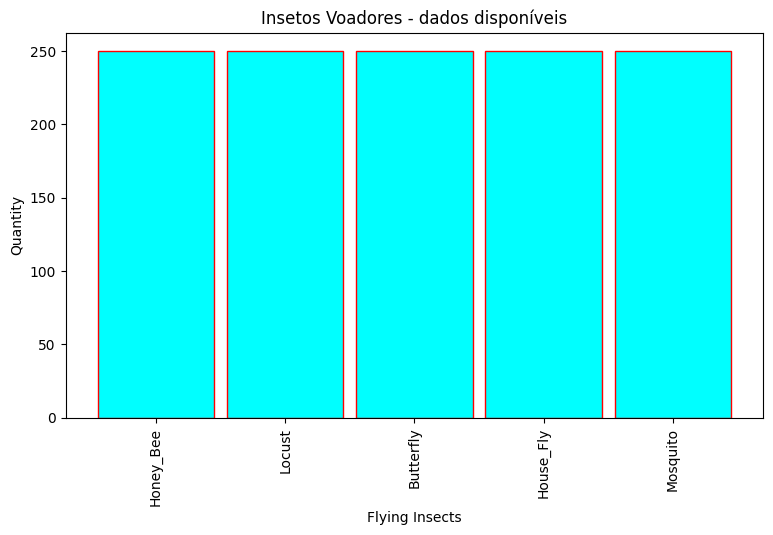

In [ ]:
print((df['class']).value_counts())

plt.figure(figsize = (9,5))
plt.xlabel('Flying Insects')
plt.ylabel('Quantity')
flying_insects_count = df['class'].value_counts().plot.bar(title='Insetos Voadores - dados disponíveis',width= 0.9, align='center',color='cyan', edgecolor = 'red')

# X. Visualizando algumas imagens do conjunto de dados.

**PROBLEMA:** Encontramos dificuldade em manipular imagens em preto e branco, visto que o vetor img.shape possui apenas duas posições quando a imagem está em escala de cinza. Para conseguir trabalhar com imagens com essa característica, adicionamos a lógica vista abaixo.

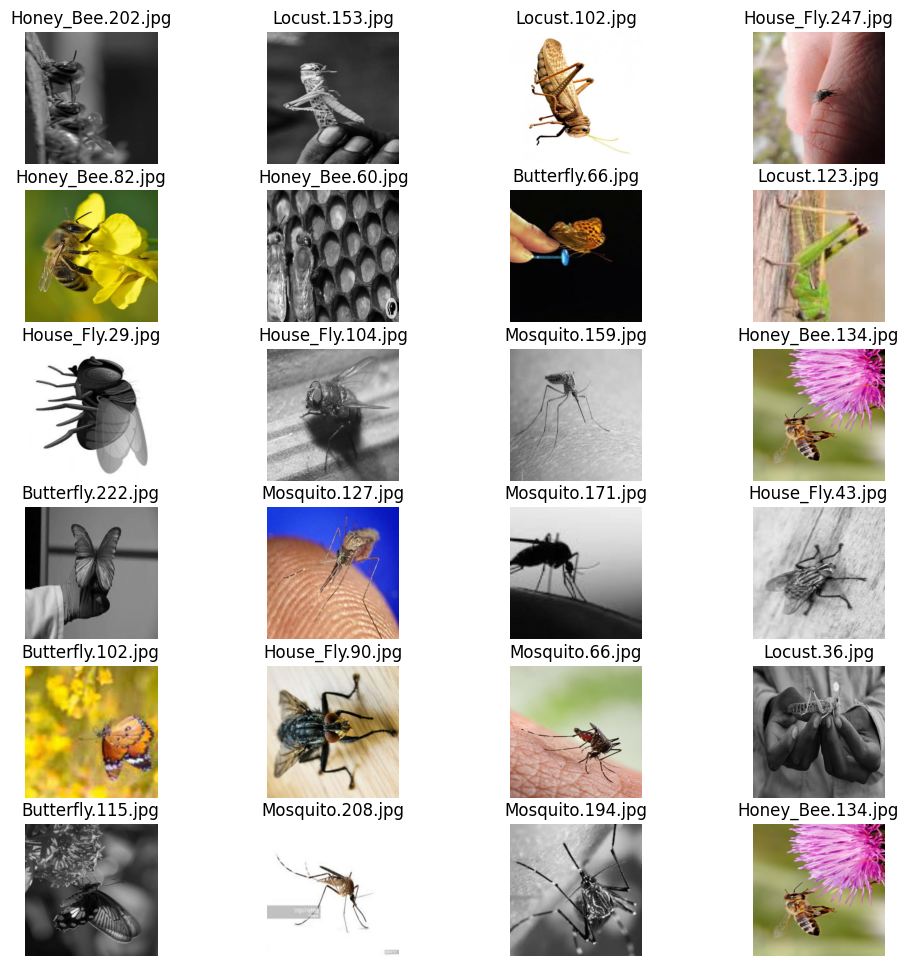

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 24 imagens
for i in range(24):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(6, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    if len(img.shape) == 2: # Tratamento para imagens que vierem com apenas 1 canal de cor (grayscale)
      plt.imshow(img,cmap='gray', vmin=0, vmax=255)
    else:
      plt.imshow(img)
    plt.title(sample)

plt.show()

**Divisão dos dados em treino e teste:** 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem possuir nenhum elemento em comum.

In [ ]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

Vamos imprimir os conjuntos "train" e "test" de forma visualizar a disposição dos campos. Observe que as imagens possuem um ID, um NAME e uma CLASS (que é o atributo target).

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                 images      class
807   Honey_Bee.132.jpg  Honey_Bee
700      Locust.200.jpg     Locust
299   Honey_Bee.198.jpg  Honey_Bee
542      Locust.175.jpg     Locust
1029   Butterfly.91.jpg  Butterfly
...                 ...        ...
1044  Honey_Bee.196.jpg  Honey_Bee
1095  Honey_Bee.127.jpg  Honey_Bee
1130   Mosquito.123.jpg   Mosquito
860      Locust.169.jpg     Locust
1126      Locust.65.jpg     Locust

[875 rows x 2 columns]
##### Test: #####
                 images      class
680   Honey_Bee.175.jpg  Honey_Bee
1102  House_Fly.197.jpg  House_Fly
394      Locust.142.jpg     Locust
930    Mosquito.201.jpg   Mosquito
497   House_Fly.235.jpg  House_Fly
...                 ...        ...
66     Honey_Bee.13.jpg  Honey_Bee
67    Butterfly.211.jpg  Butterfly
376      Locust.202.jpg     Locust
211     Mosquito.72.jpg   Mosquito
12    House_Fly.155.jpg  House_Fly

[375 rows x 2 columns]


#### Preparação dos dados

`ImageDataGenerator` é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o `ImageDataGenerator` para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método `flow_from_dataframe()` para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, categórico porque são apenas duas classes), entre outros.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=60,
                                    shear_range=0.2,
                                    zoom_range=0.3,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='categorical',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='categorical',
    x_col='images',
    y_col='class',)

Found 700 validated image filenames belonging to 5 classes.
Found 175 validated image filenames belonging to 5 classes.
Found 375 validated image filenames belonging to 5 classes.


Visualizando um exemplo do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


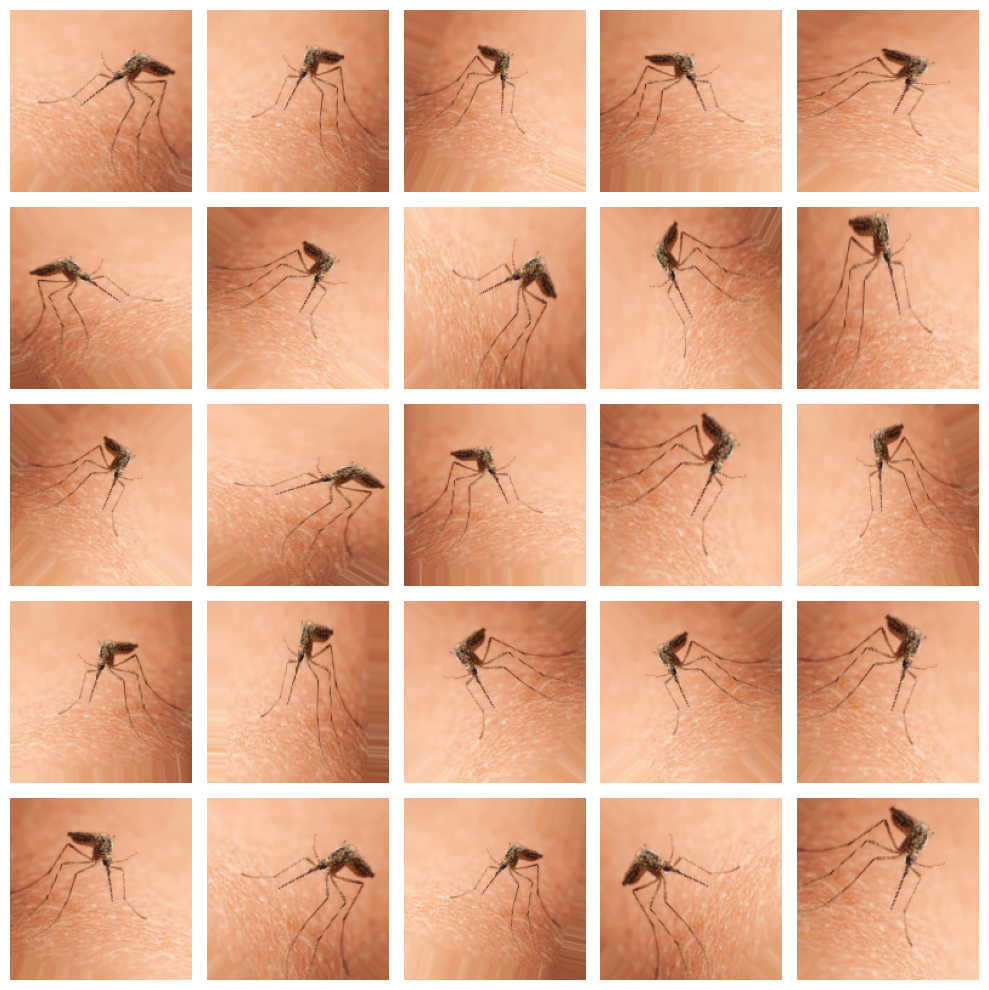

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com 5 classes
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

## 3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

#### Definição da arquitetura do modelo

Aqui é especificada uma `camada convolucional 2D` que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação `ReLU`. O parâmetro `input_shape` define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas `max-pooling` com a mesma função de ativação.

In [ ]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

Adicionaremos uma última camada densa, seguida de uma função de ativação softmax configurada para 5 saídas (categorias)

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 5 , activation='softmax' ) )

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

## 4. Treinamento do modelo de deep learning

#### Compilação do modelo Keras com as configurações do treinamento

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='categorical_crossentropy'`: especifica a função de perda a ser usada durante o treinamento.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [ ]:
# Fizemos uso do otimizador ADAM, que demonstrou maior desempenho quando comparado com o RMSPROP
# O treinamento já foi realizado, podemos pular apenas para a importação do modelo

#model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator`.

Como o **treinamento já foi realizado**, usando 20 épocas e obtendo aproximadamente 64% de acurácia, podemos pular para o passo de importação do modelo.

In [ ]:
# Passo de treinamento
# O treinamento já foi realizado, podemos pular apenas para a importação do modelo
#history=model.fit_generator(train_generator, epochs=20, validation_data=val_generator)

**Bibliotecas de persistência e nomes de arquivos** estão declaradas neste trecho. Para o KERAS, usaremos o método de persistência que já existe embutido na biblioteca.

In [ ]:
#Importanto biblioteca de persistência
import pickle

#Padronizando nomes dos arquivos
name_history = 'history_of_accuracy.sav'
path_model = 'content'
name_model = 'trained_model_FlyingInsects.model'

**EXPORTAÇÂO DO MODELO:** Como a exportação já foi realizada previamente, mantivemos este trecho comentado para fins de correção do MVP.

In [ ]:
# Salvar o histórico para compor o grafico
# A exportação já foi realizada, portanto, comentamos este trecho.

# Salvar histórico de acurácia para o disco
#pickle.dump(history, open(name_history, 'wb'))
#print("Histórico salvo em: ", name_history)

# Salvar modelo treinado para o disco
#model.save(name_model)
#!zip -r trained_model_FlyingInsects.model.zip trained_model_FlyingInsects.model/
#print("Modelo salvo em: ", "%s/%s" % (path_model,name_model))

**IMPORTAÇÃO DO MODELO:** Neste trecho estamos importando os dados históricos de treinamento do modelo, e importando também o modelo em si. Os dados históricos serão usados para a exibição do gráfico de acurácia e do gráfico de perda.

In [ ]:
#Importando os modelos prontos para uso pelo orientador do MVP

# Carregando o history pela biblioteca Pickle
loaded_history = pickle.load(open(name_history, 'rb'))
print("Histórico %s carregado com sucesso" % (name_history))

# Carregando o model pela biblioteca de salvamento nativa do Keras
loaded_model = keras.models.load_model(name_model)
print("Modelo %s carregado com sucesso" % (name_model))


Histórico history_of_accuracy.sav carregado com sucesso
Modelo trained_model_FlyingInsects.model carregado com sucesso


Separaremos os dados históricos em 4 variáveis para apresentação nos gráficos.

In [ ]:
history_loss = pd.DataFrame(loaded_history.history['loss'])
history_val_loss = pd.DataFrame(loaded_history.history['val_loss'])
history_accuracy = pd.DataFrame(loaded_history.history['accuracy'])
history_val_accuracy = pd.DataFrame(loaded_history.history['val_accuracy'])

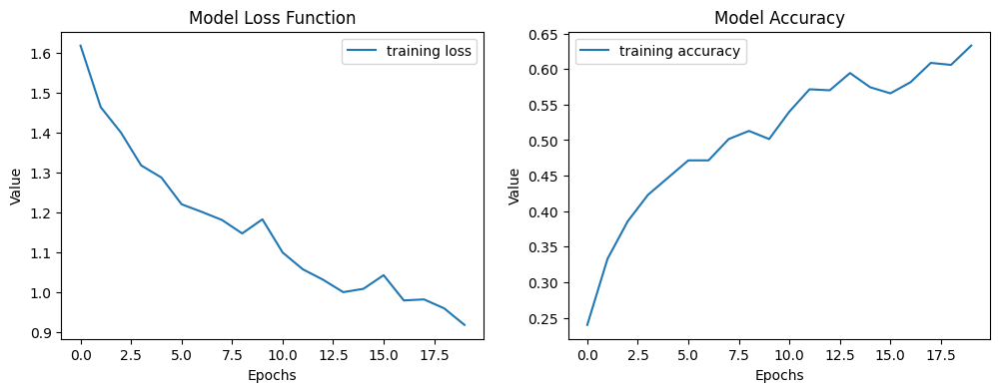

In [ ]:
# Gerando gráfico de perda por época
arr_loss = history_loss.to_numpy()
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
plt.xlabel("Epochs")
plt.ylabel("Value")
plt.plot(arr_loss, label='training loss')
plt.title('Model Loss Function')
plt.legend()
# Gerando gráfico de acurácia por época
arr_accuracy = history_accuracy.to_numpy()
plt.subplot(1,2,2)
plt.xlabel("Epochs")
plt.ylabel("Value")
plt.plot(arr_accuracy, label='training accuracy')
plt.title('Model Accuracy')
plt.legend()
plt.show()

## 5. Execução do modelo treinado em um subconjunto das imagems de teste
Idealmente se deseja realizar a inferência sobre todo o conjunto de teste, porém para efeitos de agilidade, executamos apenas em um subconjunto de imagens.

2/2 [==============================] - 1s 249ms/step
-----------------------------------------
TESTE NUMERO:  0


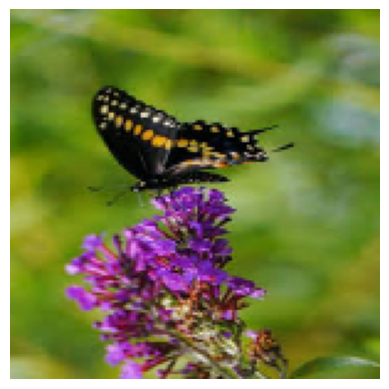

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 86.91 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 7.88 %
 - Classe House_Fly: 3.22 %
 - Classe Locust: 0.38 %
 - Classe Mosquito: 1.60 %
-----------------------------------------
TESTE NUMERO:  1


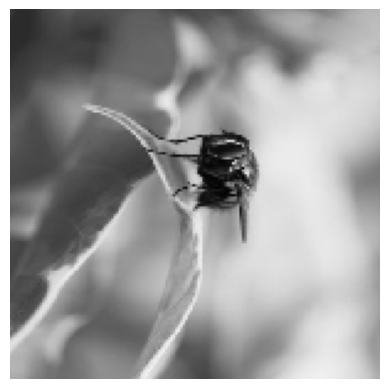

Classe real:  House_Fly
Classe predita:  House_Fly
Probabilidade de ser a classe predita: 54.03 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 1.05 %
 - Classe Honey_Bee: 4.72 %
 - Classe Locust: 2.24 %
 - Classe Mosquito: 37.96 %
-----------------------------------------
TESTE NUMERO:  2


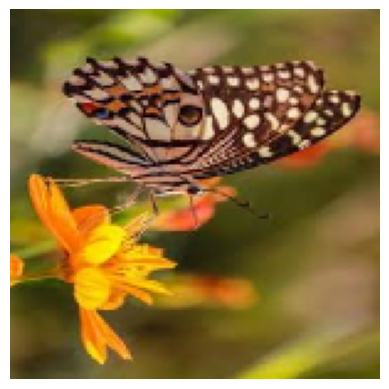

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 97.58 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 2.25 %
 - Classe House_Fly: 0.03 %
 - Classe Locust: 0.13 %
 - Classe Mosquito: 0.00 %
-----------------------------------------
TESTE NUMERO:  3


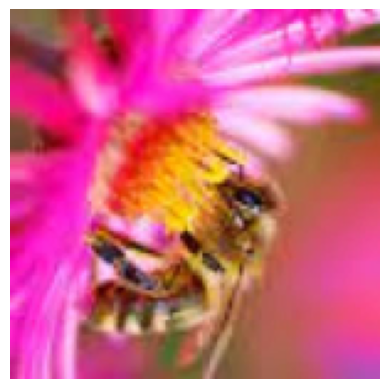

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 97.97 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.10 %
 - Classe House_Fly: 0.16 %
 - Classe Locust: 1.74 %
 - Classe Mosquito: 0.02 %
-----------------------------------------
TESTE NUMERO:  4


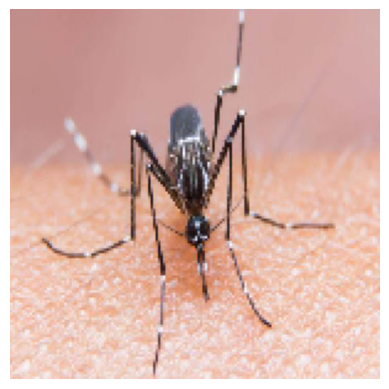

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 54.34 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.01 %
 - Classe Honey_Bee: 0.54 %
 - Classe House_Fly: 44.74 %
 - Classe Locust: 0.37 %
-----------------------------------------
TESTE NUMERO:  5


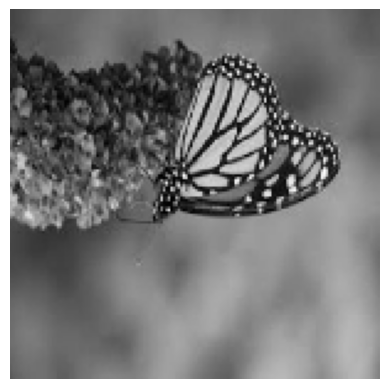

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 99.50 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 0.00 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 0.08 %
 - Classe Mosquito: 0.42 %
-----------------------------------------
TESTE NUMERO:  6


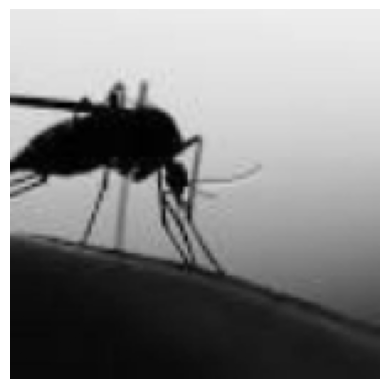

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 45.46 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 6.98 %
 - Classe Honey_Bee: 11.73 %
 - Classe House_Fly: 5.63 %
 - Classe Locust: 30.21 %
-----------------------------------------
TESTE NUMERO:  7


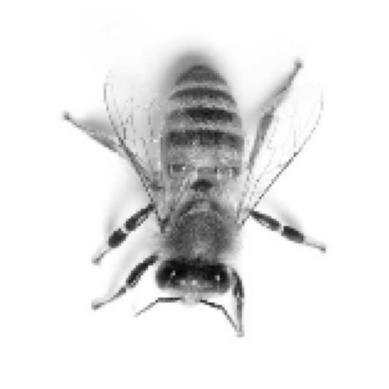

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 63.07 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.25 %
 - Classe House_Fly: 30.77 %
 - Classe Locust: 4.92 %
 - Classe Mosquito: 0.99 %
-----------------------------------------
TESTE NUMERO:  8


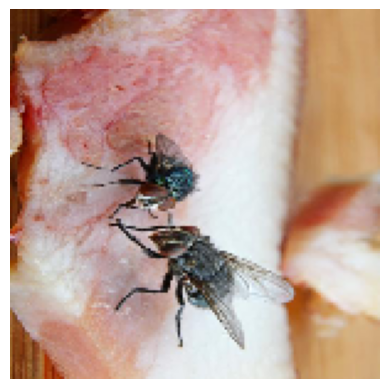

Classe real:  House_Fly
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 65.45 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 1.04 %
 - Classe Honey_Bee: 10.27 %
 - Classe House_Fly: 10.71 %
 - Classe Locust: 12.53 %
-----------------------------------------
TESTE NUMERO:  9


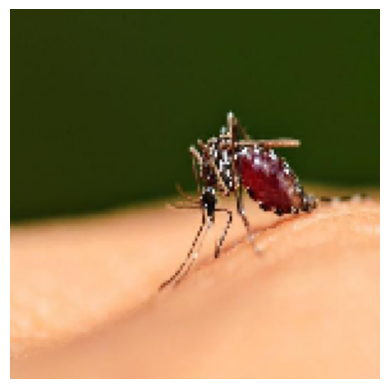

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 99.08 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.35 %
 - Classe Honey_Bee: 0.07 %
 - Classe House_Fly: 0.47 %
 - Classe Locust: 0.03 %
-----------------------------------------
TESTE NUMERO:  10


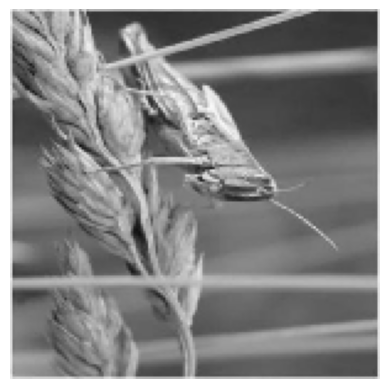

Classe real:  Locust
Classe predita:  Locust
Probabilidade de ser a classe predita: 40.45 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 23.11 %
 - Classe Honey_Bee: 32.54 %
 - Classe House_Fly: 2.69 %
 - Classe Mosquito: 1.21 %
-----------------------------------------
TESTE NUMERO:  11


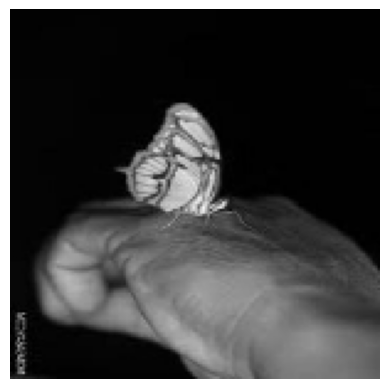

Classe real:  Butterfly
Classe predita:  Locust
Probabilidade de ser a classe predita: 27.01 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 25.29 %
 - Classe Honey_Bee: 25.12 %
 - Classe House_Fly: 3.76 %
 - Classe Mosquito: 18.81 %
-----------------------------------------
TESTE NUMERO:  12


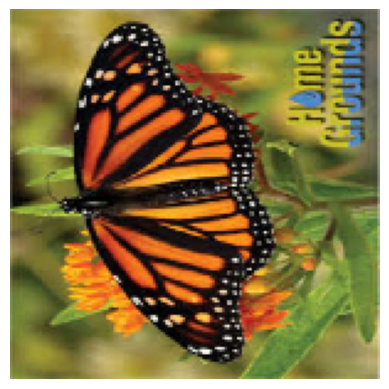

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 100.00 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 0.00 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 0.00 %
 - Classe Mosquito: 0.00 %
-----------------------------------------
TESTE NUMERO:  13


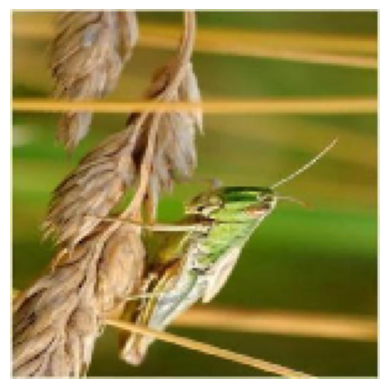

Classe real:  Locust
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 31.13 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 30.66 %
 - Classe House_Fly: 4.66 %
 - Classe Locust: 29.86 %
 - Classe Mosquito: 3.68 %
-----------------------------------------
TESTE NUMERO:  14


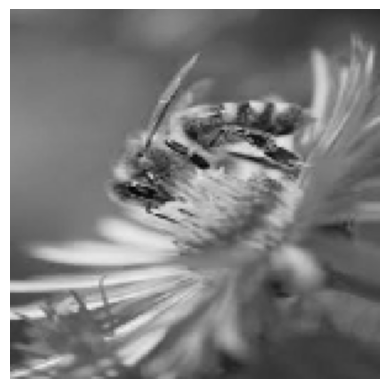

Classe real:  Honey_Bee
Classe predita:  Locust
Probabilidade de ser a classe predita: 30.86 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 29.60 %
 - Classe Honey_Bee: 24.60 %
 - Classe House_Fly: 2.76 %
 - Classe Mosquito: 12.18 %
-----------------------------------------
TESTE NUMERO:  15


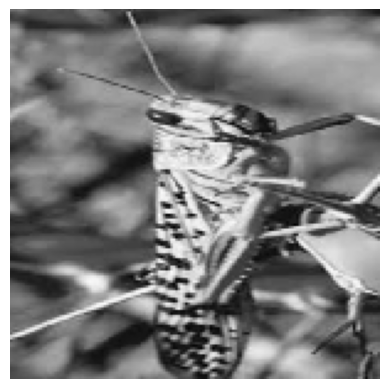

Classe real:  Locust
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 59.42 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 1.90 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 38.66 %
 - Classe Mosquito: 0.02 %
-----------------------------------------
TESTE NUMERO:  16


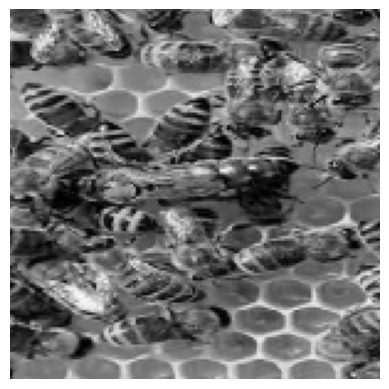

Classe real:  Honey_Bee
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 71.88 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 13.94 %
 - Classe House_Fly: 0.41 %
 - Classe Locust: 13.76 %
 - Classe Mosquito: 0.01 %
-----------------------------------------
TESTE NUMERO:  17


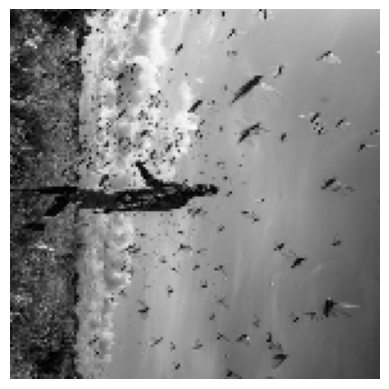

Classe real:  Locust
Classe predita:  Locust
Probabilidade de ser a classe predita: 43.13 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 10.50 %
 - Classe Honey_Bee: 8.74 %
 - Classe House_Fly: 6.42 %
 - Classe Mosquito: 31.21 %
-----------------------------------------
TESTE NUMERO:  18


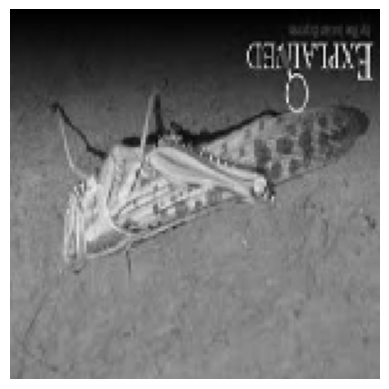

Classe real:  Locust
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 81.50 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 0.42 %
 - Classe House_Fly: 0.13 %
 - Classe Locust: 9.02 %
 - Classe Mosquito: 8.93 %
-----------------------------------------
TESTE NUMERO:  19


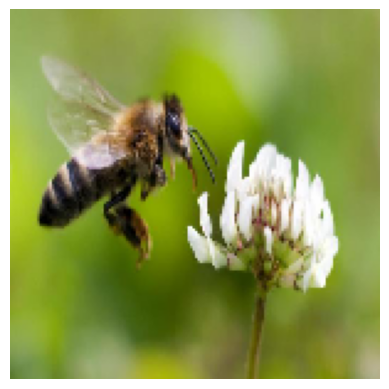

Classe real:  Honey_Bee
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 40.36 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 22.89 %
 - Classe House_Fly: 2.95 %
 - Classe Locust: 3.43 %
 - Classe Mosquito: 30.38 %
-----------------------------------------
TESTE NUMERO:  20


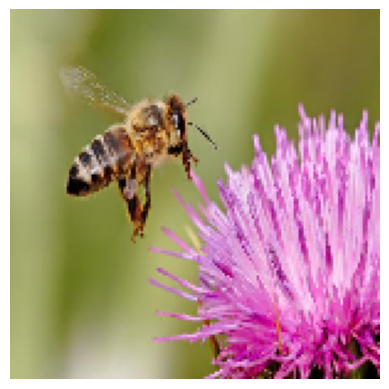

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 44.28 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 23.92 %
 - Classe House_Fly: 1.47 %
 - Classe Locust: 13.38 %
 - Classe Mosquito: 16.95 %
-----------------------------------------
TESTE NUMERO:  21


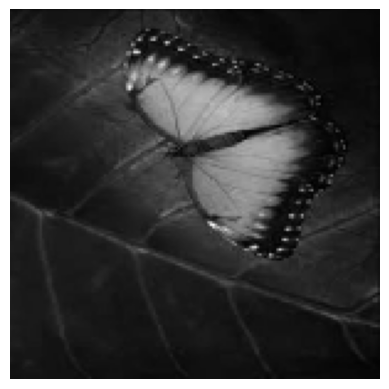

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 55.96 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 5.34 %
 - Classe House_Fly: 0.29 %
 - Classe Locust: 36.43 %
 - Classe Mosquito: 1.97 %
-----------------------------------------
TESTE NUMERO:  22


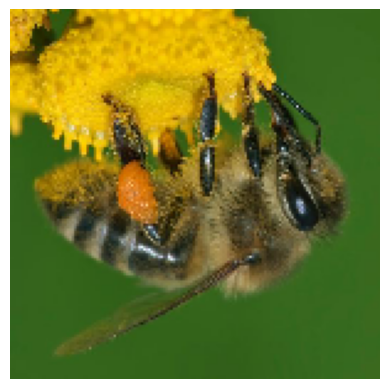

Classe real:  Honey_Bee
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 61.01 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 34.35 %
 - Classe House_Fly: 0.15 %
 - Classe Locust: 1.45 %
 - Classe Mosquito: 3.04 %
-----------------------------------------
TESTE NUMERO:  23


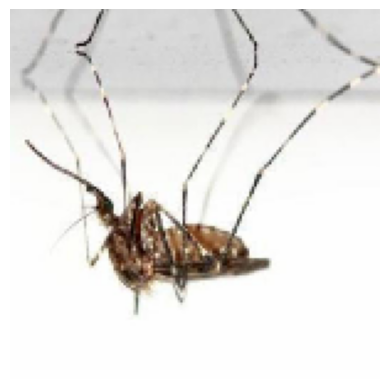

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 49.70 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.68 %
 - Classe Honey_Bee: 33.03 %
 - Classe House_Fly: 2.28 %
 - Classe Locust: 14.30 %
-----------------------------------------
TESTE NUMERO:  24


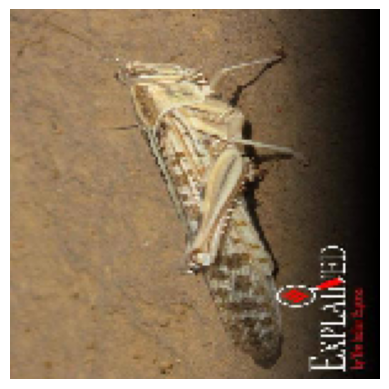

Classe real:  Locust
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 63.80 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 0.18 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 35.96 %
 - Classe Mosquito: 0.05 %
-----------------------------------------
TESTE NUMERO:  25


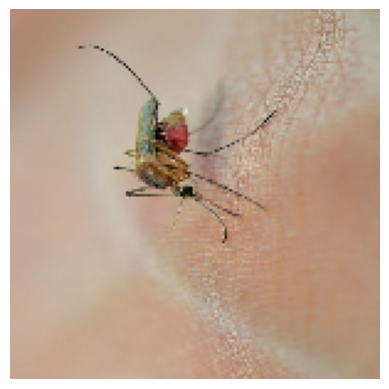

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 72.83 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 1.87 %
 - Classe Honey_Bee: 11.38 %
 - Classe House_Fly: 7.55 %
 - Classe Locust: 6.37 %
-----------------------------------------
TESTE NUMERO:  26


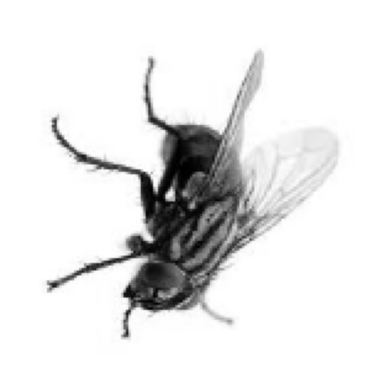

Classe real:  House_Fly
Classe predita:  House_Fly
Probabilidade de ser a classe predita: 99.28 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.00 %
 - Classe Honey_Bee: 0.21 %
 - Classe Locust: 0.04 %
 - Classe Mosquito: 0.47 %
-----------------------------------------
TESTE NUMERO:  27


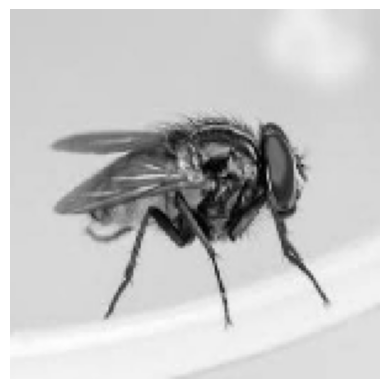

Classe real:  House_Fly
Classe predita:  House_Fly
Probabilidade de ser a classe predita: 95.38 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.05 %
 - Classe Honey_Bee: 2.08 %
 - Classe Locust: 0.19 %
 - Classe Mosquito: 2.30 %
-----------------------------------------
TESTE NUMERO:  28


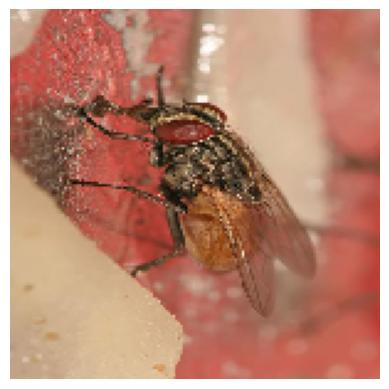

Classe real:  House_Fly
Classe predita:  House_Fly
Probabilidade de ser a classe predita: 53.97 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.68 %
 - Classe Honey_Bee: 10.47 %
 - Classe Locust: 1.88 %
 - Classe Mosquito: 33.01 %
-----------------------------------------
TESTE NUMERO:  29


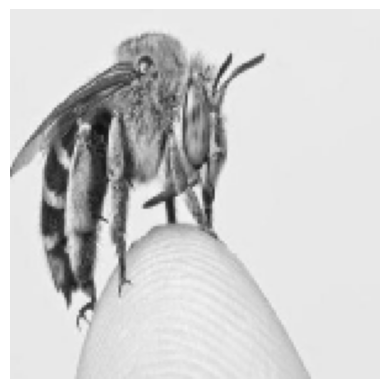

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 40.86 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 6.68 %
 - Classe House_Fly: 17.13 %
 - Classe Locust: 32.94 %
 - Classe Mosquito: 2.39 %
-----------------------------------------
TESTE NUMERO:  30


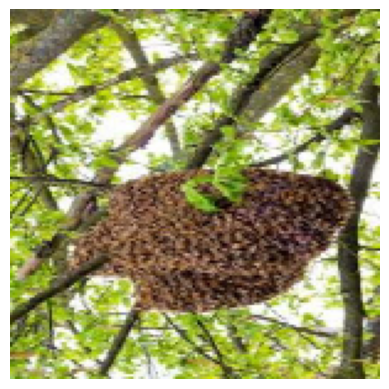

Classe real:  Honey_Bee
Classe predita:  Locust
Probabilidade de ser a classe predita: 43.13 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 36.79 %
 - Classe Honey_Bee: 20.03 %
 - Classe House_Fly: 0.05 %
 - Classe Mosquito: 0.00 %
-----------------------------------------
TESTE NUMERO:  31


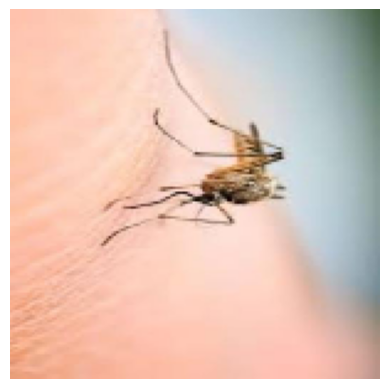

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 92.77 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.35 %
 - Classe Honey_Bee: 3.24 %
 - Classe House_Fly: 2.10 %
 - Classe Locust: 1.54 %
-----------------------------------------
TESTE NUMERO:  32


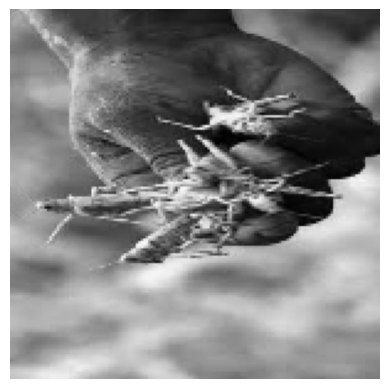

Classe real:  Locust
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 38.39 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 21.63 %
 - Classe Honey_Bee: 21.30 %
 - Classe House_Fly: 1.30 %
 - Classe Locust: 17.38 %
-----------------------------------------
TESTE NUMERO:  33


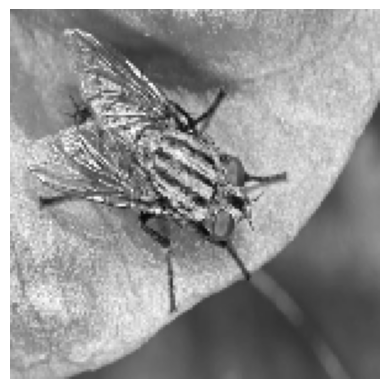

Classe real:  House_Fly
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 60.05 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 9.57 %
 - Classe Honey_Bee: 8.27 %
 - Classe House_Fly: 10.01 %
 - Classe Locust: 12.09 %
-----------------------------------------
TESTE NUMERO:  34


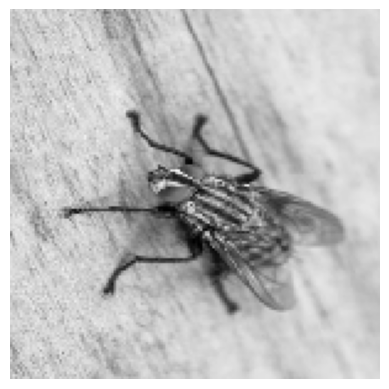

Classe real:  House_Fly
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 58.94 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.02 %
 - Classe Honey_Bee: 0.49 %
 - Classe House_Fly: 39.60 %
 - Classe Locust: 0.95 %
-----------------------------------------
TESTE NUMERO:  35


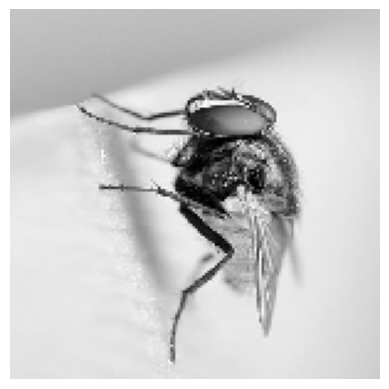

Classe real:  House_Fly
Classe predita:  House_Fly
Probabilidade de ser a classe predita: 87.95 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.03 %
 - Classe Honey_Bee: 0.46 %
 - Classe Locust: 0.05 %
 - Classe Mosquito: 11.51 %
-----------------------------------------
TESTE NUMERO:  36


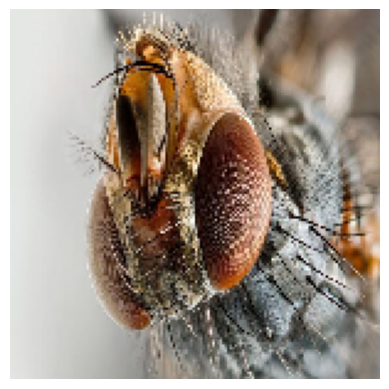

Classe real:  House_Fly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 53.66 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 15.60 %
 - Classe House_Fly: 2.15 %
 - Classe Locust: 28.37 %
 - Classe Mosquito: 0.23 %
-----------------------------------------
TESTE NUMERO:  37


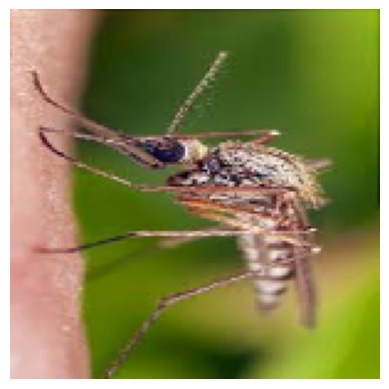

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 36.27 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 22.09 %
 - Classe Honey_Bee: 21.89 %
 - Classe House_Fly: 11.94 %
 - Classe Locust: 7.80 %
-----------------------------------------
TESTE NUMERO:  38


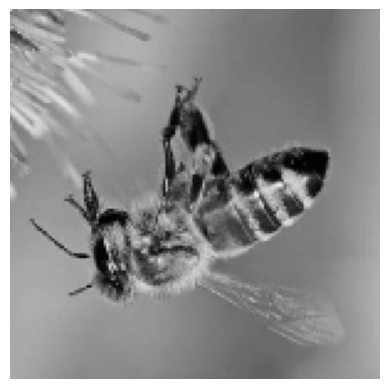

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 56.52 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 17.85 %
 - Classe House_Fly: 7.80 %
 - Classe Locust: 16.75 %
 - Classe Mosquito: 1.08 %
-----------------------------------------
TESTE NUMERO:  39


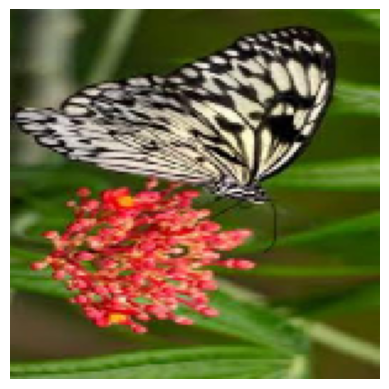

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 99.97 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 0.00 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 0.02 %
 - Classe Mosquito: 0.01 %
-----------------------------------------
TESTE NUMERO:  40


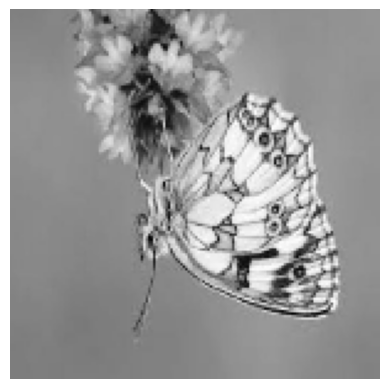

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 52.15 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 21.24 %
 - Classe House_Fly: 0.21 %
 - Classe Locust: 26.15 %
 - Classe Mosquito: 0.25 %
-----------------------------------------
TESTE NUMERO:  41


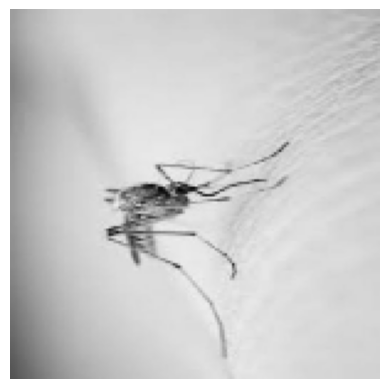

Classe real:  Mosquito
Classe predita:  Mosquito
Probabilidade de ser a classe predita: 81.09 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 0.54 %
 - Classe Honey_Bee: 6.31 %
 - Classe House_Fly: 8.14 %
 - Classe Locust: 3.92 %
-----------------------------------------
TESTE NUMERO:  42


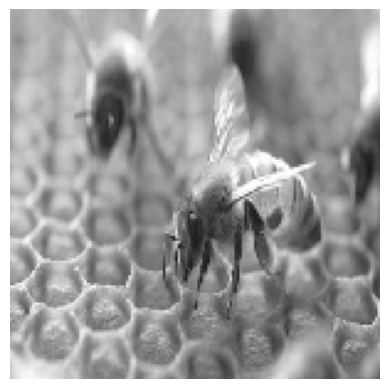

Classe real:  Honey_Bee
Classe predita:  Locust
Probabilidade de ser a classe predita: 43.77 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 7.68 %
 - Classe Honey_Bee: 41.73 %
 - Classe House_Fly: 5.20 %
 - Classe Mosquito: 1.63 %
-----------------------------------------
TESTE NUMERO:  43


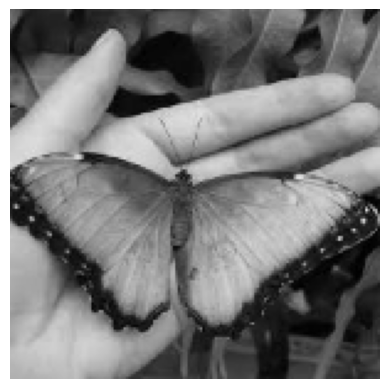

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 48.74 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 15.42 %
 - Classe House_Fly: 0.14 %
 - Classe Locust: 35.70 %
 - Classe Mosquito: 0.01 %
-----------------------------------------
TESTE NUMERO:  44


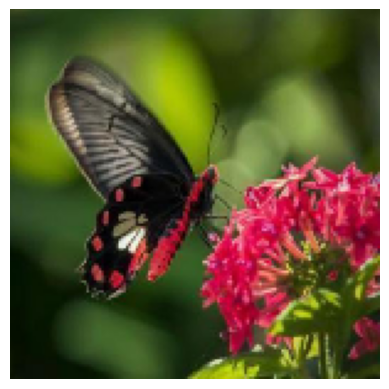

Classe real:  Butterfly
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 96.04 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 3.00 %
 - Classe House_Fly: 0.11 %
 - Classe Locust: 0.68 %
 - Classe Mosquito: 0.16 %
-----------------------------------------
TESTE NUMERO:  45


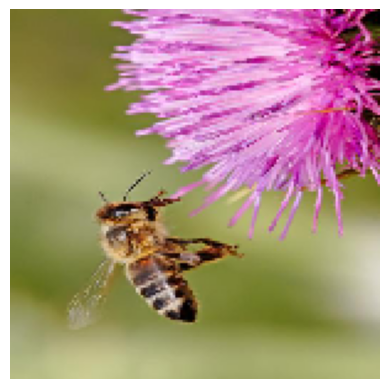

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 53.08 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 9.10 %
 - Classe House_Fly: 0.37 %
 - Classe Locust: 34.50 %
 - Classe Mosquito: 2.96 %
-----------------------------------------
TESTE NUMERO:  46


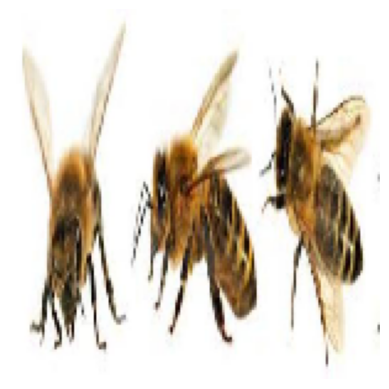

Classe real:  Honey_Bee
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 62.43 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 1.12 %
 - Classe House_Fly: 1.80 %
 - Classe Locust: 34.65 %
 - Classe Mosquito: 0.00 %
-----------------------------------------
TESTE NUMERO:  47


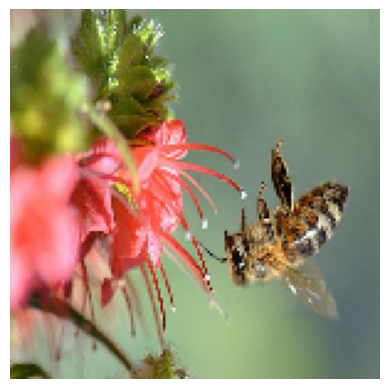

Classe real:  Honey_Bee
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 58.24 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 10.13 %
 - Classe House_Fly: 0.04 %
 - Classe Locust: 30.04 %
 - Classe Mosquito: 1.55 %
-----------------------------------------
TESTE NUMERO:  48


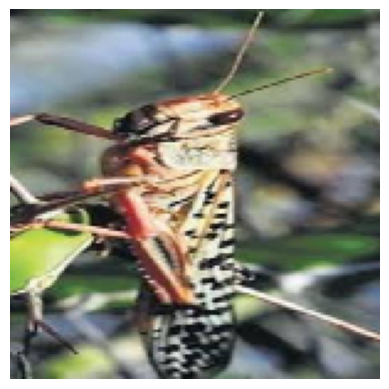

Classe real:  Locust
Classe predita:  Butterfly
Probabilidade de ser a classe predita: 51.70 %
Probabilidade de ser das outras classes: 
 - Classe Honey_Bee: 3.34 %
 - Classe House_Fly: 0.00 %
 - Classe Locust: 44.95 %
 - Classe Mosquito: 0.01 %
-----------------------------------------
TESTE NUMERO:  49


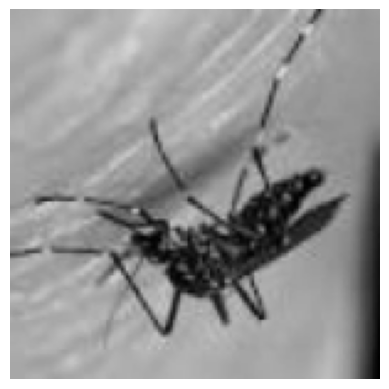

Classe real:  Mosquito
Classe predita:  Honey_Bee
Probabilidade de ser a classe predita: 34.08 %
Probabilidade de ser das outras classes: 
 - Classe Butterfly: 4.87 %
 - Classe House_Fly: 21.93 %
 - Classe Locust: 29.79 %
 - Classe Mosquito: 9.32 %


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Butterfly','Honey_Bee','House_Fly','Locust','Mosquito']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            print('-----------------------------------------')
            image = images[i]
            label = labels[i] #Label chega em formato One Hot Encoding
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            real_label = class_names[np.argmax(label)]
            y_true.append(real_label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            print('TESTE NUMERO: ', i)
            if np.argmax(prediction) == 0:
                class_name = 'Butterfly'
            elif np.argmax(prediction) == 1:
                class_name = 'Honey_Bee'
            elif np.argmax(prediction) == 2:
                class_name = 'House_Fly'
            elif np.argmax(prediction) == 3:
                class_name = 'Locust'
            elif np.argmax(prediction) == 4:
                class_name = 'Mosquito'

            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Classe real: ", real_label)
            print("Classe predita: ", class_name)
            print("Probabilidade de ser a classe predita: %1.2f %%"%(probability*100))
            print("Probabilidade de ser das outras classes: ")
            for m in range(len(label)):
                if np.argmax(prediction) != m:
                    print(' - Classe %s: %1.2f %%'%(class_names[m],prediction[m]*100))



## 6. Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste

In [ ]:
loss, accuracy = loaded_model.evaluate_generator(test_generator)
print("Test: accuracy = %1.2f %%  ;  loss = %1.2f %% " % (accuracy*100, loss*100))

<ipython-input-25-df53529e140c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = loaded_model.evaluate_generator(test_generator)


Test: accuracy = 62.67 %  ;  loss = 98.36 % 


#### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average=None)
recall = skm.recall_score(y_true, y_pred, average=None)
f1score = skm.f1_score(y_true, y_pred, average=None)

print("Accuracy: %1.2f %%" % (accuracy*100))
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy: 62.00 %
Precision:  [0.5        0.77777778 1.         0.33333333 0.66666667]
Recall:  [0.9        0.5        0.55555556 0.25       0.88888889]
F1 Score:  [0.64285714 0.60869565 0.71428571 0.28571429 0.76190476]


Matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

Matriz de confusão sem normalização


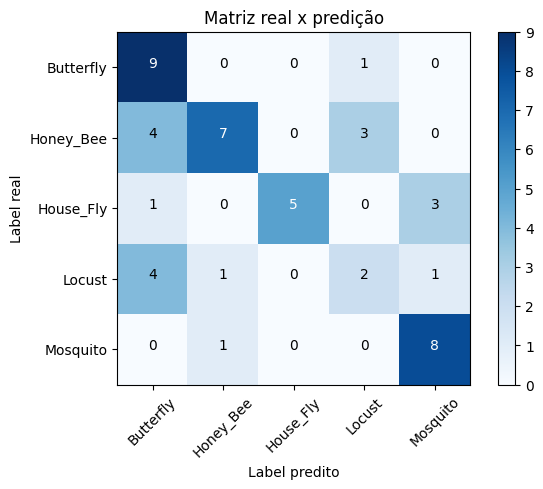

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['Butterfly','Honey_Bee','House_Fly','Locust','Mosquito'],
                      normalize= False,
                      title='Matriz real x predição')

**DESCOBERTAS:**
 - Este modelo conseguiu dar respostas precisas para predição de mosquitos e abelhas. Ou seja, quando a imagem era de um mosquito ou abelha realmente, o modelo  acertava em cerca de 90% dos casos.
 - Este modelo conseguiu dar boas respostas para a predição de moscas e abelhas. Em cerca de 50% dos casos ele acerta que imagens de borboletas e abelhas são realmente deles.
 - Para gafanhotos, o modelo teve desempenho ruim, próximo de 25% (praticamente aleatório, quando consideramos que são 5 possibilidades de predição).
